# **KNN Patch Core and ResNet Latent Space**


## *1. Dataset Loading and Preprocessing*

### **1.1. Importing Required Libraries**

#### **File Handling & Data Processing**
- `Path`, `os`, `shutil`: Handle file and directory operations.
- `pandas`, `numpy`: Provide tools for data manipulation.
- `pickle`: Serializes and saves Python objects.

#### **Image Processing**
- `PIL.Image`: Handles image loading and processing.
- `torchvision.transforms`: Applies transformations like resizing and normalization.

#### **Deep Learning with PyTorch**
- `torch`: Core PyTorch library for tensor computation and model building.
- `torchvision`: Provides datasets, pre-trained models, and utilities.
- `resnet50, ResNet50_Weights`: Loads the ResNet-50 model with pre-trained weights.


In [1]:
from pathlib import Path
import numpy as np
import os, shutil
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pickle
from PIL import Image


from tqdm.auto import tqdm

import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import transforms
import torch.optim as optim

from torchvision.models import resnet50, ResNet50_Weights

c:\Users\peppe\anaconda3\envs\MVTEC_torch_py310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### **1.2. Loading the Dataset**

#### Dataset Path Handling
- Dynamically finds the dataset directory.
- Normalizes the file path for cross-platform compatibility.

#### Reading CSV File
- `pd.read_csv(file_path)`: Loads the dataset into a Pandas DataFrame.

#### Extracting Categories
- `complete_df['category'].unique()`: Retrieves unique categories.
- `np.sort()`: Sorts categories for consistency.


In [2]:
# Load the dataset
dataset_dir = os.path.join(os.path.dirname(os.path.abspath("__file__")), "..\..\..\Dataset")
dataset_dir = os.path.normpath(dataset_dir)
file_path = os.path.join(dataset_dir, 'mvtec_meta_features_dataset.csv')
complete_df = pd.read_csv(file_path)

# create a list of the categories
categories = np.sort(complete_df['category'].unique())
min_categories = 0
max_categories = 15

### **1.3. Defining the Checkpoint Directory**

#### Purpose
- Ensures a directory (`Checkpoints/`) exists for storing model checkpoints.
- If the directory does not exist, it is created using `os.makedirs()`.


In [3]:
#Define the checkpoint file path
checkpoint_dir = os.path.join(os.path.dirname(os.path.abspath("__file__")), 'Checkpoints')
os.makedirs(checkpoint_dir, exist_ok=True)

### **1.4. Loading Image and Ground Truth Paths**

- Dynamically loads image paths and ground truth paths for all categories.
- Uses `os.walk()` to traverse directories and find images.
- Filters images based on common extensions (`.png`, `.jpg`, `.jpeg`, etc.).
- Stores paths in dictionaries (`train_image_paths_dict`, `test_image_paths_dict`, `gt_image_paths_dict`).


In [5]:
# Function to get all image and ground_truth paths for all categories
def load_image_paths_from_category(category):
    train_path = os.path.join(dataset_dir, category, 'train')
    test_path = os.path.join(dataset_dir, category, 'test')
    gt_path = os.path.join(dataset_dir, category, 'ground_truth')
    
    def get_image_paths(root_path):
        image_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif')
        image_paths = []
        for dirpath, _, filenames in os.walk(root_path):
            for filename in filenames:
                if filename.lower().endswith(image_extensions):
                    image_paths.append(os.path.join(dirpath, filename))
        return image_paths
    
    def get_ground_truth_paths(root_path):
        ground_truth_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif')
        ground_truth_paths = []
        for dirpath, _, filenames in os.walk(root_path):
            for filename in filenames:
                if filename.lower().endswith(ground_truth_extensions):
                    ground_truth_paths.append(os.path.join(dirpath, filename))
        return ground_truth_paths
    
    # Get image and ground_truth paths
    train_image_paths = get_image_paths(train_path)
    test_image_paths = get_image_paths(test_path)
    gt_image_paths = get_ground_truth_paths(gt_path)
   
    return train_image_paths, test_image_paths, gt_image_paths

# Initialize dictionaries to store images
train_image_paths_dict = {}
test_image_paths_dict = {}
gt_image_paths_dict = {}

for category in categories:
    train_image_paths, test_image_paths, gt_image_paths = load_image_paths_from_category(category)
    train_image_paths_dict[category] = train_image_paths
    test_image_paths_dict[category] = test_image_paths
    gt_image_paths_dict[category] = gt_image_paths


### **1.5. Defining Image Transformations**

#### Transformations Applied
- **Resize (224×224)** → Standard input size for ResNet.
- **ToTensor()** → Converts image to PyTorch tensor (normalizing pixel values to [0,1]).


In [6]:
from torchvision.datasets import ImageFolder
from torchvision.transforms import transforms

# Define the transformation pipeline using torchvision.transforms.Compose
transform = transforms.Compose([
    transforms.Resize((224,224)),  # Resize the image to 224x224 pixels
    transforms.ToTensor()          # Convert the image to a PyTorch tensor and divide by 255.0
])


### **1.6. Loading the Training Dataset Using ImageFolder**

- Loads images for each category using **ImageFolder**.
- Applies transformations (Resize and ToTensor).
- Stores dataset objects in **good_datasets_dict**.

- Automatically assigns labels based on subdirectory names.
- Loads images efficiently with a predefined structure.


In [7]:
# Define the path to the training images
# Load the train dataset using the ImageFolder dataset class
# ImageFolder is a PyTorch dataset class for loading images from a directory
# It automatically loads images from subdirectories and applies transformations to them
# In this case, 'transform' is a transformation applied to each image in the dataset
# It preprocesses the images before they are used for training
# Initialize an empty dictionary to store datasets for all categories
good_datasets_dict = {}

# Iterate through each category and load the dataset
for category in categories:
    train_image_path = os.path.join(dataset_dir, category, 'train')
    dataset = ImageFolder(root=train_image_path, transform=transform)
    good_datasets_dict[category] = dataset

## *2. Load a Pretrained ResNet Model*

In the following picture we can see how the pretrained resent model is built. 
The paper "DFR: Deep Feature Reconstruction for Unsupervised Anomaly Segmentation" tells us that we should extract feature from the internal layers. At the end of (layer2) and (layer3) for example
![image.png](attachment:image.png)


#### **Class Overview**:
  - `resnet_feature_extractor`: A custom class for extracting feature maps from a pretrained ResNet-50 model, specifically from the last block of `layer2` and `layer3`.


####  **ResNet-50 Model Loading**:
  - Load the pretrained ResNet-50 model with ImageNet weights using `resnet50(weights=ResNet50_Weights.DEFAULT)`.
  - Set the model to evaluation mode using `.eval()`, disabling operations like dropout and batch normalization updates.
  
####  **Freezing Parameters**:
  - Freeze all parameters in the model to prevent them from being updated by setting `param.requires_grad = False`.
  
####  **Hooks for Feature Extraction**:
  - Define a hook function to capture feature maps from the last block of `layer2` and `layer3` during the forward pass.
  - Store the extracted feature maps in `self.features`.
  
####  **Forward Pass**:
  - Pass the input image through the ResNet-50 model and capture the feature maps via hooks.
  - Apply **2D average pooling** (`AvgPool2d`) with a kernel size of 3 and stride 1 to the extracted feature maps.
  - Resize the feature maps to the same spatial size using **adaptive average pooling** (`AdaptiveAvgPool2d`).
  - Concatenate the resized feature maps from `layer2` and `layer3` along the channel dimension (`torch.cat`).
  - Reshape the concatenated feature map to a column tensor (`patch`).

#### **Final Output**:
  - The output is a **flattened feature map** created by concatenating the processed feature maps from `layer2` and `layer3`, ready for further analysis or tasks like anomaly detection.



In [8]:
class resnet_feature_extractor(torch.nn.Module):
    def __init__(self):
        """This class extracts the feature maps from a pretrained ResNet model."""
        super(resnet_feature_extractor, self).__init__()

        # Load a pretrained ResNet-50 model with default ImageNet weights
        self.model = resnet50(weights=ResNet50_Weights.DEFAULT)

        # Set the model to evaluation mode (disables dropout, batch norm updates, etc.)
        self.model.eval()

        # Freeze all parameters in the ResNet model to prevent them from being updated
        for param in self.model.parameters():
            param.requires_grad = False

        # Hook function to extract feature maps during the forward pass
        def hook(module, input, output) -> None:
            """This hook saves the extracted feature map in self.features."""
            self.features.append(output)

        # Register the hook on the last block of layer2 to extract its output
        self.model.layer2[-1].register_forward_hook(hook)

        # Register the hook on the last block of layer3 to extract its output
        self.model.layer3[-1].register_forward_hook(hook)

    def forward(self, input):
        """Forward method to process the input and extract concatenated feature maps."""
        
        # Initialize the features list to store outputs from the hooks
        self.features = []

        # Perform a forward pass through the ResNet model without computing gradients
        with torch.no_grad():
            _ = self.model(input)

        # Define a 2D average pooling layer with kernel size 3 and stride 1
        self.avg = torch.nn.AvgPool2d(3, stride=1)

        # Get the spatial size (height, width) of the feature map from layer2
        fmap_size = self.features[0].shape[-2]  # Assume all feature maps have the same size

        # Define an adaptive average pooling layer to resize feature maps to the same size
        self.resize = torch.nn.AdaptiveAvgPool2d(fmap_size)

        # Resize and process the feature maps from layer2 and layer3
        resized_maps = [self.resize(self.avg(fmap)) for fmap in self.features]

        # Concatenate the processed feature maps along the channel dimension
        patch = torch.cat(resized_maps, 1)   # merge the resized feature maps along the channel dimension
        patch = patch.reshape(patch.shape[1], -1).T #create a column tensor

        # Return the concatenated feature maps as the final output
        return patch


## *3. The ResNet Feature Extractor*

  - The code extracts feature maps from `layer2` and `layer3` of the ResNet-50 model using the `resnet_feature_extractor` class.

  - It processes test images from different categories and prints the shape of the feature maps for each category.

####  **Initialize `resnet_feature_extractor`**:
  - Instantiate the `backbone` object from the `resnet_feature_extractor` class.

####  **Iterate Through Categories**:
  - Iterate through each category (from `min_categories` to `max_categories`) to process images.
  
####  **Load and Process Image**:
  - Get the first test image from each category using `test_image_paths_dict[category][0]`.
  - If the image is not in RGB mode, convert it to RGB.
  - Apply the image transformation (such as resizing, normalization) and add a batch dimension with `.unsqueeze(0)`.

####  **Extract Features**:
  - Pass the transformed image through the `backbone` to extract feature maps from `layer2` and `layer3`.

####  **Print Feature Map Shapes**:
  - Print the shapes of the extracted feature maps:
    - `Feature map from layer2: {backbone.features[0].shape}`
    - `Feature map from layer3: {backbone.features[1].shape}`
    - `Concatenated feature shape: {feature.shape}`

Category: bottle
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


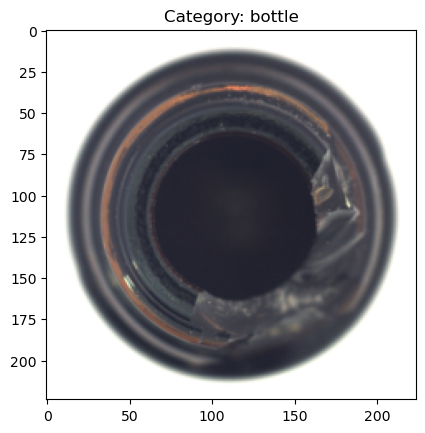

Category: cable
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


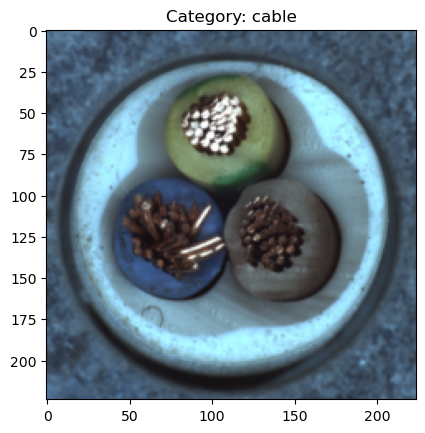

Category: capsule
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


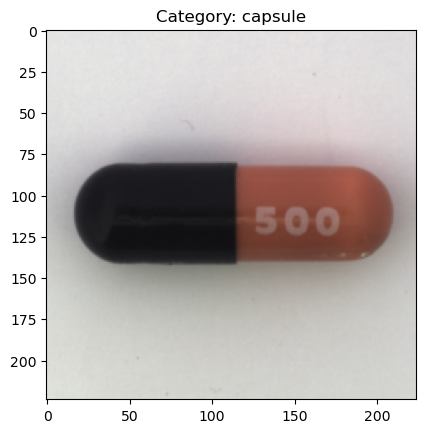

Category: carpet
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


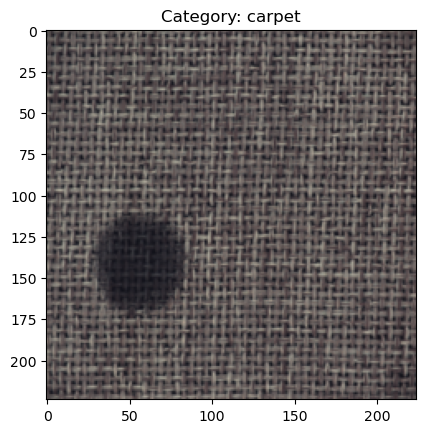

Category: grid
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


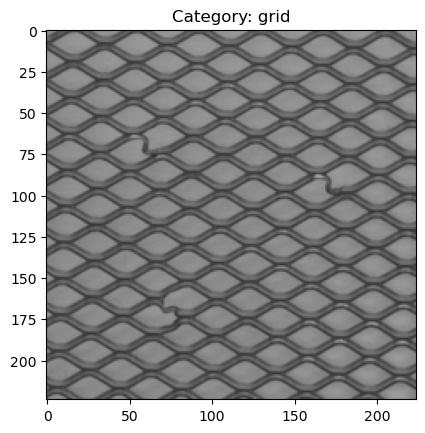

Category: hazelnut
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


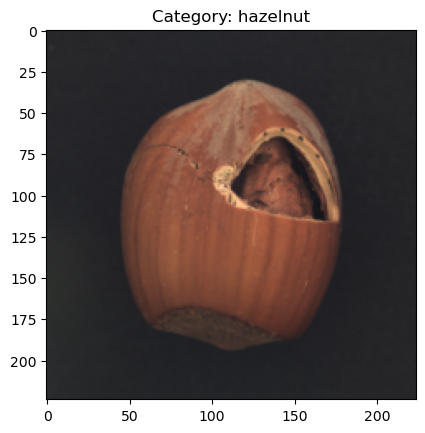

Category: leather
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


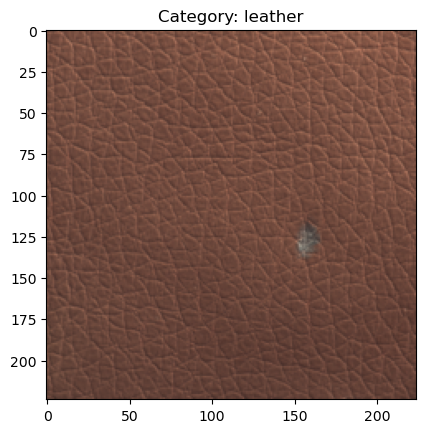

Category: metal_nut
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


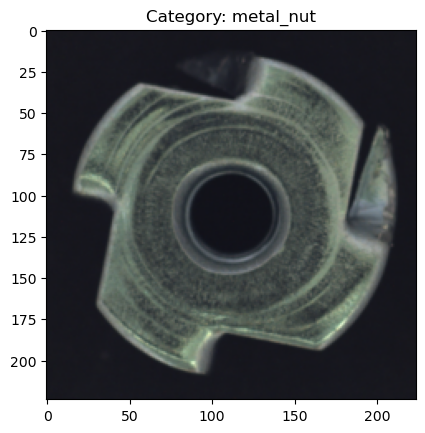

Category: pill
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


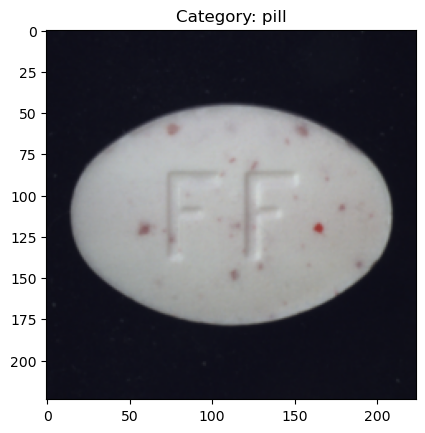

Category: screw
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


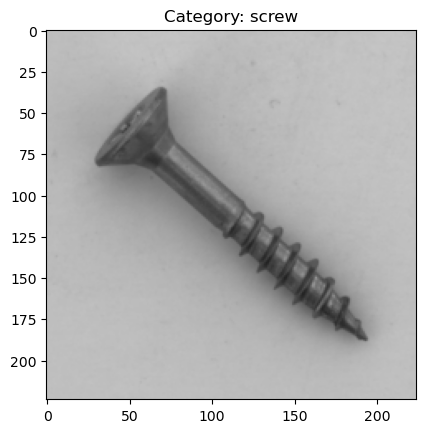

Category: tile
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


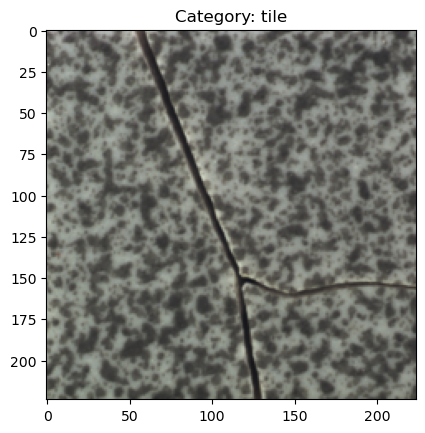

Category: toothbrush
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


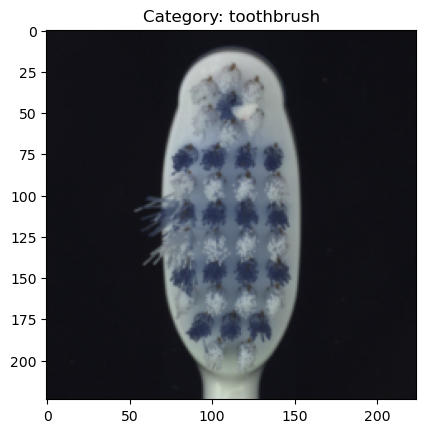

Category: transistor
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


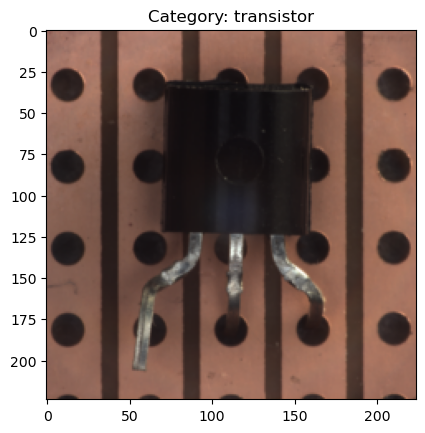

Category: wood
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


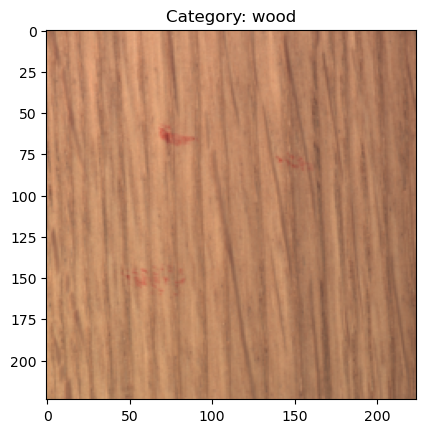

Category: zipper
Feature map from layer2: torch.Size([1, 512, 28, 28])
Feature map from layer3: torch.Size([1, 1024, 14, 14])
Concatenated feature shape: torch.Size([784, 1536])


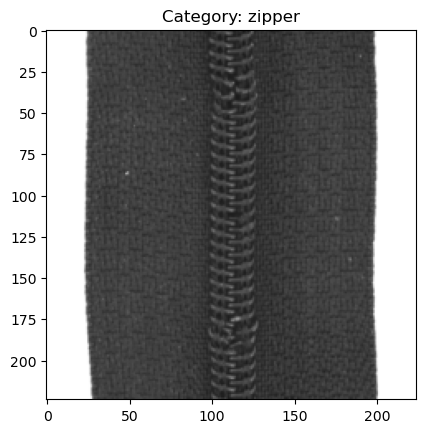

In [9]:
# Initialize the resnet_feature_extractor
backbone = resnet_feature_extractor()

# Iterate through each category and process the first test image
for category in categories[min_categories:max_categories]:
    # Get the first test image from the current category using PIL
    image = Image.open(test_image_paths_dict[category][0])
    
    # Convert grayscale image to RGB by repeating the single channel three times
    if image.mode != 'RGB':
        image = image.convert('RGB')
    
    # Apply the transformation and add a batch dimension
    image = transform(image).unsqueeze(0)
    
    # Extract features using the backbone
    feature = backbone(image)
    
    # Print the shapes of the extracted feature maps
    print(f"Category: {category}")
    print(f"Feature map from layer2: {backbone.features[0].shape}")
    print(f"Feature map from layer3: {backbone.features[1].shape}")
    print(f"Concatenated feature shape: {feature.shape}")
    
   


## *4. Create a Memory Bank*

### **4.1. Creating a Memory Bank for Feature Storage**

The code initializes or loads a memory bank to store feature vectors for each category. If the memory bank already exists (stored in a checkpoint file), it will be loaded. If not, it will be created by extracting features from the training images.

#### **Load Existing Memory Bank**:
  - Check if a memory bank checkpoint exists at the specified file path (`'memory_bank_checkpoint.pkl'`).
  - If it exists, load it using `pickle.load`.
#### **Create New Memory Bank**:
  - If no memory bank exists, create a new dictionary (`memory_bank_dict`) to store features for each category.
  - For each category in `train_image_paths_dict`, extract features using the `backbone` (ResNet model) for all images in the category.
  - Store the extracted features for each category in the memory bank.
#### **Save the Memory Bank**:
  - After processing all categories, save the memory bank to a file using `pickle.dump`.


In [10]:
checkpoint_file = os.path.join(checkpoint_dir, 'memory_bank_checkpoint.pkl')

if os.path.exists(checkpoint_file):
    with open(checkpoint_file, 'rb') as f:
        memory_bank_dict = pickle.load(f)
else:
    memory_bank_dict = {}

    for category, paths in train_image_paths_dict.items():
        memory_bank = []
        for pth in tqdm(paths, leave=False):
            with torch.no_grad():
                data = transform(Image.open(pth).convert('RGB')).cuda().unsqueeze(0)
                backbone.cuda()  # Ensure the model is on the GPU
                features = backbone(data)
                memory_bank.append(features.cpu().detach())
        memory_bank_dict[category] = torch.cat(memory_bank, dim=0).cuda()
    
    with open(checkpoint_file, 'wb') as f:
        pickle.dump(memory_bank_dict, f)


### **4.2. Selecting 10% of Total Patches** 

Randomly select 10% of the total patches in the memory bank for each category to reduce computation time and memory usage during inference (to Avoid Long Inference Time).

#### **Select Indices**:
  - For each category in `memory_bank_dict`, randomly choose 10% of the available indices using `np.random.choice`.
#### **Update Memory Bank**:
  - For each category, keep only the selected 10% of memory bank entries.
  - Store the selected indices for later use in `selected_indices_dict`.


In [11]:
selected_indices_dict = {}  # New dictionary to store selected indices for each category

for category, memory_bank in memory_bank_dict.items():
    selected_indices = np.random.choice(len(memory_bank), size=len(memory_bank)//10, replace=False)
    memory_bank_dict[category] = memory_bank[selected_indices]
    # Store the selected indices for this category
    selected_indices_dict[category] = selected_indices

## *5. Processing Train Images Using K Nearest Neighbors (K-NN)* 

 This code calculates the anomaly score for each image in the training set by measuring the distance to the nearest neighbors in the memory bank and stores these scores (OK train images using KNN for Anomaly Detection).


#### **Load or Create y_score Dictionary**:
  - Check if the anomaly scores (`y_score_dict`) are already stored in a checkpoint file (`'y_score_checkpoint.pkl'`).
  - If the file exists, load the dictionary. If not, create it by calculating scores for each image in the training dataset.
#### **Distance Calculation**:
  - For each image, compute the distance between its feature vector and the feature vectors stored in the memory bank using `torch.cdist` (L2 distance).
  - The score is determined as the maximum distance to the closest memory bank feature (i.e., the `s_star` value).
#### **Store y_scores**:
  - For each category, store the computed anomaly scores (`y_score`) in `y_score_dict`.
#### **Save y_scores**:
  - After calculating scores for all categories, save `y_score_dict` to the checkpoint file using `pickle.dump`.


In [12]:
checkpoint_file = os.path.join(checkpoint_dir, 'y_score_checkpoint.pkl')

if os.path.exists(checkpoint_file):
    with open(checkpoint_file, 'rb') as f:
        y_score_dict = pickle.load(f)
else:
    y_score_dict = {}
    for category in categories[min_categories:max_categories]:
        y_score = []
        memory_bank = memory_bank_dict[category]

        for pth in tqdm(train_image_paths_dict[category], leave=False):
            image = Image.open(pth).convert('RGB')  # Ensure the image is in RGB format
            data = transform(image).cuda().unsqueeze(0)
            with torch.no_grad():
                features = backbone(data)

            distances = torch.cdist(features, memory_bank, p=2.0)
            dist_score, dist_score_idxs = torch.min(distances, dim=1)
            s_star = torch.max(dist_score)
            segm_map = dist_score.view(1, 1, 28, 28)
            y_score.append(s_star.cpu().numpy())

        y_score_dict[category] = y_score

    with open(checkpoint_file, 'wb') as f:
        pickle.dump(y_score_dict, f)


## *6. Visualize Score Distribution and Compute Thresholds for Each Category*

This code visualizes the distribution of anomaly scores for each category and computes a threshold based on the mean and standard deviation of the scores.


#### **Plot Score Distribution**:
  - Create a histogram for the anomaly scores of each category using `matplotlib`.
  - Draw a vertical line at the computed threshold (mean + 2 * standard deviation) to distinguish between normal and anomalous scores.
#### **Compute Threshold**:
  - For each category, calculate the threshold as the mean score plus 2 times the standard deviation.
  - Store the computed threshold in `best_thresholds` for each category.
#### **Print Thresholds**:
  - After plotting, print the thresholds for each category.
#### **Remove Unused Subplots**:
  - If there are unused subplots (in case the number of categories doesn't perfectly fit into the grid), remove them from the plot.


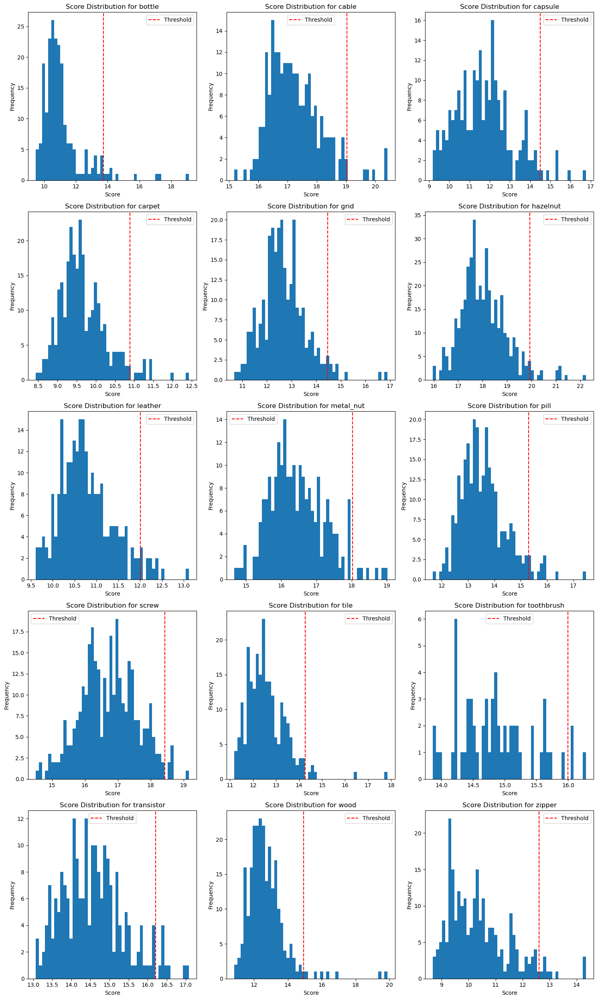

bottle: 13.7459
cable: 19.0330
capsule: 14.5103
carpet: 10.8907
grid: 14.4673
hazelnut: 19.9288
leather: 12.0102
metal_nut: 18.0284
pill: 15.3008
screw: 18.4329
tile: 14.2741
toothbrush: 15.9960
transistor: 16.2054
wood: 14.9351
zipper: 12.6053


In [13]:
n_categories = len(categories[min_categories:max_categories])
n_cols = 3
n_rows = n_categories // n_cols + int(n_categories % n_cols > 0)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

# Dictionary to store best thresholds
best_thresholds = {}

for ax, category in zip(axes, categories[min_categories:max_categories]):
    scores = y_score_dict[category]
    threshold = np.mean(scores) + 2 * np.std(scores)
    
    # Store the threshold
    best_thresholds[category] = threshold
    
    ax.hist(scores, bins=50)
    ax.axvline(x=threshold, color='r', linestyle='--', label='Threshold')
    ax.set_title(f'Score Distribution for {category}')
    ax.set_xlabel('Score')
    ax.set_ylabel('Frequency')
    ax.legend()

# Remove any unused subplots
for ax in axes[n_categories:]:
    fig.delaxes(ax)

plt.tight_layout()
plt.show()

# Print thresholds for each category
for category, threshold in best_thresholds.items():
    print(f"{category}: {threshold:.4f}")

## *7. Calculate and Save Anomaly Scores for Test Images*

This code computes the anomaly scores for test images by comparing their features with the features stored in the memory bank and saves the scores and true labels for evaluation.


####  **Load or Create y_score_test and y_true Dictionaries**:
  - Check if the anomaly scores (`y_score_test_dict`) and true labels (`y_true_dict`) are already stored in a checkpoint file (`'y_score_test_checkpoint.pkl'`).
  - If the file exists, load the dictionary using `pickle.load`. If not, create the dictionaries.
####  **Feature Extraction for Test Images**:
  - For each test image, extract features using the pretrained ResNet model (`backbone`).
  - Compute the distance between the extracted features and the memory bank using `torch.cdist` (L2 distance).
  - Calculate the anomaly score for each image as the maximum distance (`s_star`) to the closest memory bank feature.
####  **Store True Labels**:
  - The true labels for the test images are determined from the directory structure (`'good'` for normal images, and `1` for anomalous images).
####  **Save Results**:
  - After processing all test images, save the `y_score_test_dict` (anomaly scores) and `y_true_dict` (true labels) to the checkpoint file using `pickle.dump`.


In [21]:
checkpoint_file = os.path.join(checkpoint_dir, 'y_score_test_checkpoint.pkl')

if os.path.exists(checkpoint_file):
    with open(checkpoint_file, 'rb') as f:
        y_score_test_dict, y_true_dict = pickle.load(f)
else:
    y_score_test_dict = {}
    y_true_dict = {}

    for category in categories[min_categories:max_categories]:
        y_score = []
        y_true = []
        memory_bank = memory_bank_dict[category].cuda()  # Ensure memory bank is on the GPU

        for pth in tqdm(test_image_paths_dict[category], leave=False):
            image = Image.open(pth).convert('RGB')  # Ensure the image is in RGB format
            data = transform(image).cuda().unsqueeze(0)
            with torch.no_grad():
                backbone.cuda()  # Ensure the model is on the GPU
                features = backbone(data)  # Ensure the model is on the GPU

            distances = torch.cdist(features, memory_bank, p=2.0)
            dist_score, dist_score_idxs = torch.min(distances, dim=1)
            s_star = torch.max(dist_score)
            segm_map = dist_score.view(1, 1, 28, 28) 
            y_score.append(s_star.cpu().numpy())

            # Determine the class label from the file path
            class_label = os.path.basename(os.path.dirname(pth))
            y_true.append(0 if class_label == 'good' else 1)

        y_score_test_dict[category] = y_score
        y_true_dict[category] = y_true

    with open(checkpoint_file, 'wb') as f:
        pickle.dump((y_score_test_dict, y_true_dict), f)


## *8. Visualize Score Distributions for Train and Test Images*


This code visualizes the distribution of anomaly scores for both training and test images for each category. It plots histograms and compares the scores from the training and test sets.


####  **Plot Score Distributions**:
  - For each category, plot the histogram of anomaly scores for both training (`train_scores`) and test (`test_scores`) images.
  - Use different colors for the histograms of train (green) and test (red) scores.
  - Add a vertical line to indicate the threshold for anomaly detection, retrieved from `best_thresholds`.
####  **Remove Unused Subplots**:
  - If there are any unused subplots (due to an uneven number of categories), remove them from the figure to make the plot cleaner.
####  **Display Plot**:
  - After plotting, display the final figure with `plt.tight_layout()` and `plt.show()`.


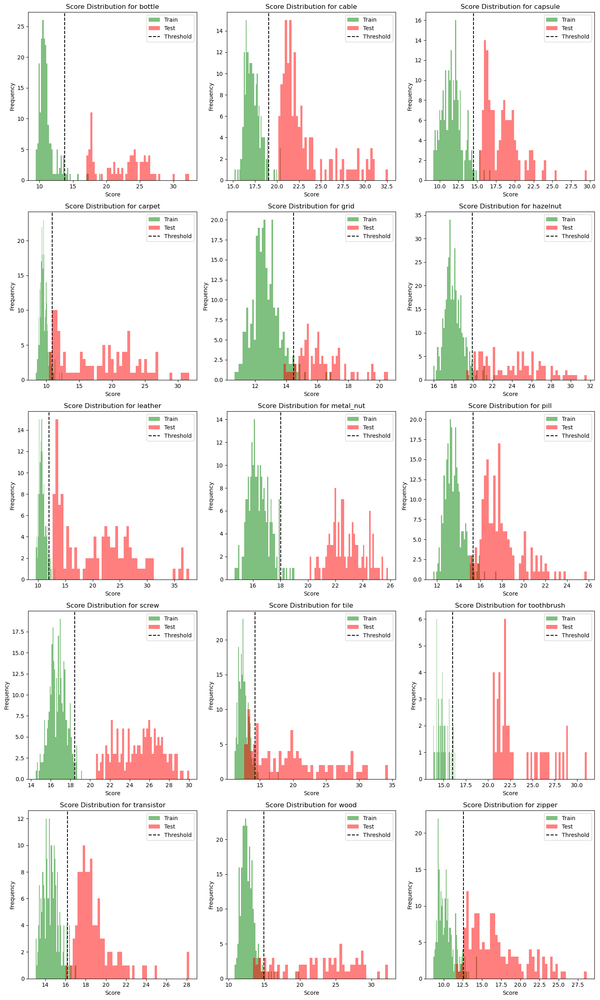

In [ ]:
n_categories = len(categories[min_categories:max_categories])
n_cols = 3
n_rows = n_categories // n_cols + int(n_categories % n_cols > 0)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for ax, category in zip(axes, categories[min_categories:max_categories]):
    # Get scores for both normal (good) and anomalous cases
    train_scores = y_score_dict[category]
    test_scores = y_score_test_dict[category]
    
    # Retrieve the best threshold from the dictionary
    threshold = best_thresholds[category]
    
    # Plot histograms
    ax.hist(train_scores, bins=50, alpha=0.5, label='Train', color='green')
    ax.hist(test_scores, bins=50, alpha=0.5, label='Test', color='red')
    ax.axvline(x=threshold, color='black', linestyle='--', label='Threshold')
    
    ax.set_title(f'Score Distribution for {category}')
    ax.set_xlabel('Score')
    ax.set_ylabel('Frequency')
    ax.legend()

# Remove any unused subplots
for ax in axes[n_categories:]:
    fig.delaxes(ax)

plt.tight_layout()
plt.show()

## *9. Evaluation Metrics: ROC Curve and Confusion Matrix*

This code evaluates the model performance by plotting ROC curves, calculating AUC scores, and generating confusion matrices for each category.
  
####  **Plot ROC Curves**:
  - For each category, calculate the AUC (Area Under the Curve) using `roc_auc_score` and plot the ROC curve using `roc_curve`.
  - The ROC curve is plotted for each category, with the False Positive Rate (FPR) on the x-axis and the True Positive Rate (TPR) on the y-axis.
  - A diagonal line representing a random classifier is also plotted for reference.
####  **Plot Confusion Matrices**:
  - For each category, compute the confusion matrix using `confusion_matrix` and plot it using `ConfusionMatrixDisplay`.
  - The best threshold for classification is selected based on the F1 score for each category, calculated using `f1_score`.
  - The confusion matrix is plotted for each category with labels "OK" (normal) and "NOK" (anomalous).


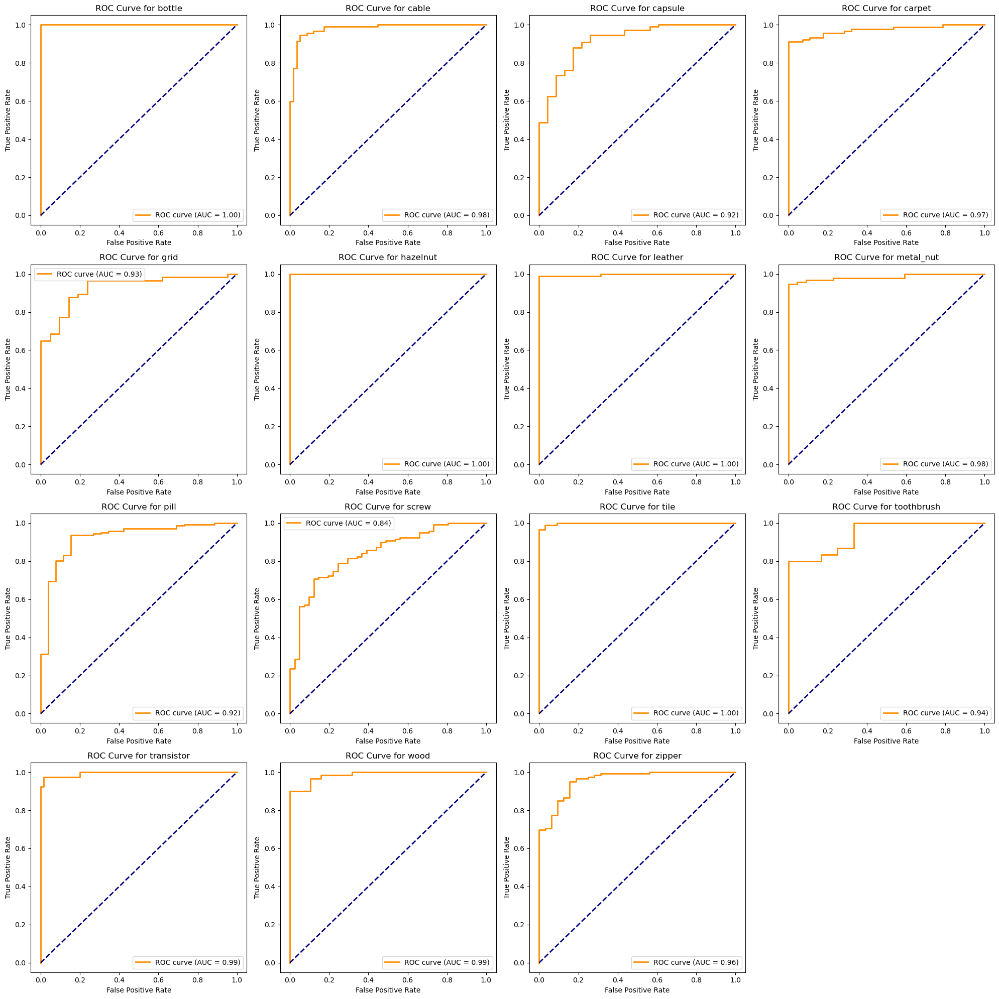

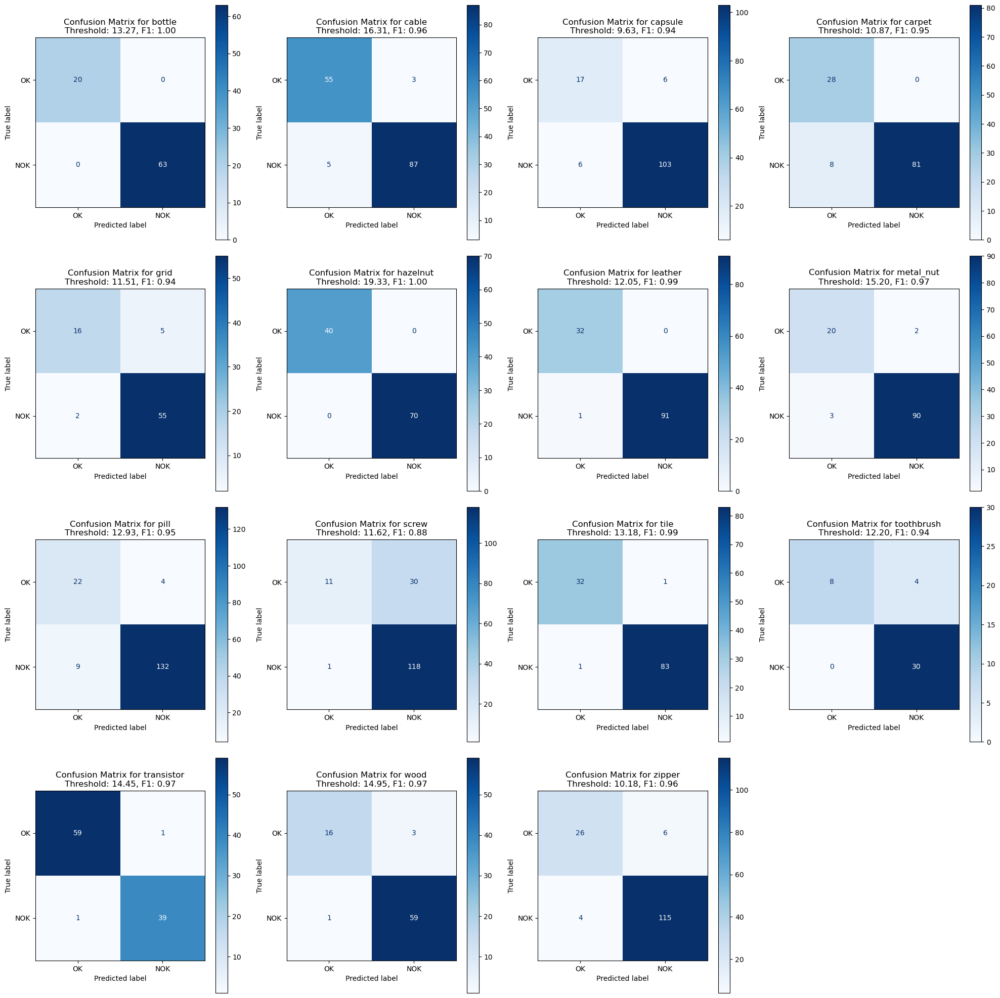

In [84]:
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, ConfusionMatrixDisplay, f1_score
import matplotlib.pyplot as plt
import numpy as np

categories = list(y_score_dict.keys())
n_categories = len(categories)
n_cols = 4
n_rows = n_categories // n_cols + int(n_categories % n_cols > 0)

# Plot ROC Curves
fig_roc, axes_roc = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
axes_roc = axes_roc.flatten()

for ax, category in zip(axes_roc, categories):
    y_true = y_true_dict[category]
    y_score = y_score_test_dict.get(category, [])
    
    # Calculate AUC-ROC
    auc = roc_auc_score(y_true, y_score)
    fpr, tpr, _ = roc_curve(y_true, y_score)
    
    # Plot ROC curve
    ax.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {auc:.2f})')
    ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    ax.set_title(f'ROC Curve for {category}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend()

# Remove any unused subplots
for ax in axes_roc[len(categories):]:
    fig_roc.delaxes(ax)

plt.tight_layout()
plt.show()

# Plot Confusion Matrices
fig_cm, axes_cm = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
axes_cm = axes_cm.flatten()

for ax, category in zip(axes_cm, categories):
    y_true = y_true_dict[category]
    y_score = y_score_test_dict.get(category, [])
    _, _, thresholds = roc_curve(y_true, y_score)
    
    f1_scores = [f1_score(y_true, y_score >= threshold) for threshold in thresholds]

    # Select the best threshold based on F1 score
    best_threshold = thresholds[np.argmax(f1_scores)]
    best_f1 = max(f1_scores)
    
    
    # Generate confusion matrix
    cm = confusion_matrix(y_true, (y_score >= best_threshold).astype(int))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['OK', 'NOK'])
    disp.plot(ax=ax, cmap=plt.cm.Blues, values_format='d')
    ax.set_title(f'Confusion Matrix for {category}\nThreshold: {best_threshold:.2f}, F1: {best_f1:.2f}')

# Remove any unused subplots
for ax in axes_cm[len(categories):]:
    fig_cm.delaxes(ax)

plt.tight_layout()
plt.show()


## *10. Visualize Predictions and Ground Truth for Test Images*


This code visualizes predictions on test images along with the corresponding ground truth mask and segmentation heatmaps.
  

####  **Randomly Select an Anomalous Test Image**:
  - For each category, randomly select an anomalous image (`NOK`), and retrieve its corresponding ground truth mask.
####  **Feature Extraction**:
  - Pass the test image through the pretrained ResNet model (`backbone`) to extract features and calculate the anomaly score.
####  **Segmentation Map Generation**:
  - Compute the distance between the features and the memory bank to generate a segmentation map.
  - The segmentation map is upscaled to match the original image resolution using bilinear interpolation.
####  **Plotting**:
  - Plot the original test image, the heatmap of the segmentation map, a highlight mask showing the most anomalous regions, and the ground truth mask.
  - Display the anomaly score relative to the best threshold for the category and classify the image as "OK" or "NOK".


<Figure size 1500x2500 with 0 Axes>

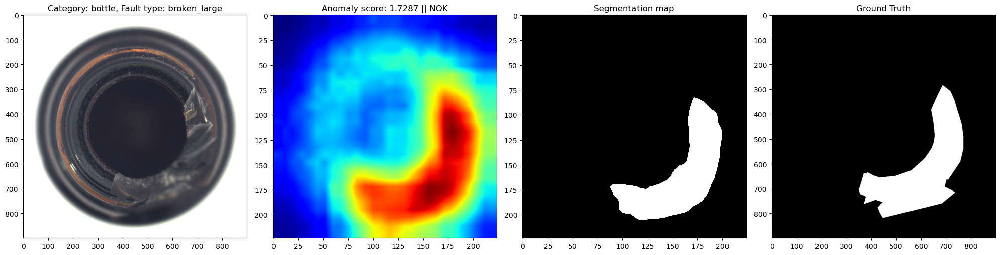

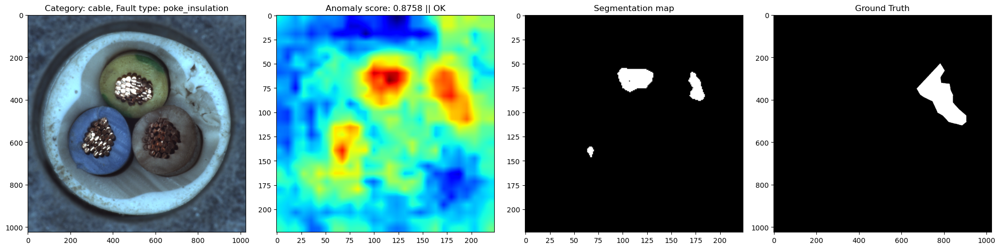

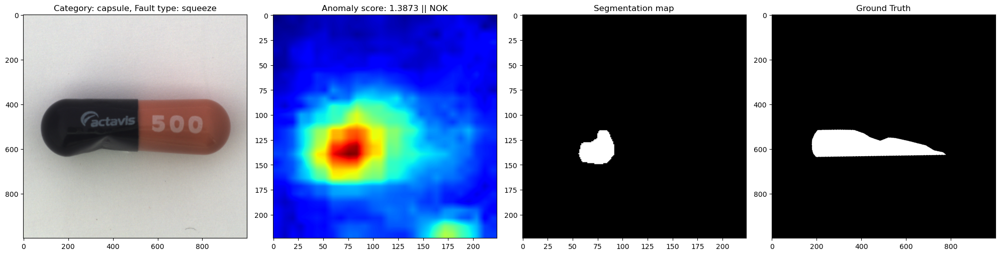

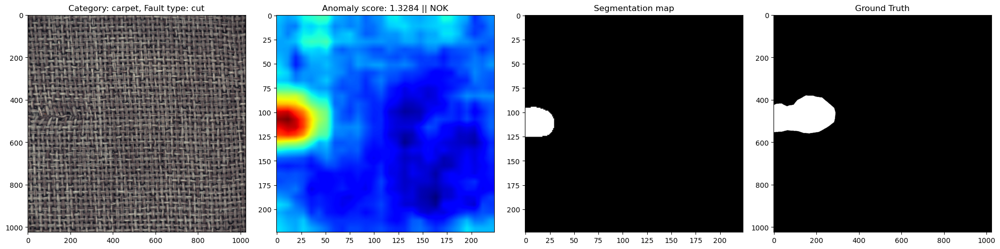

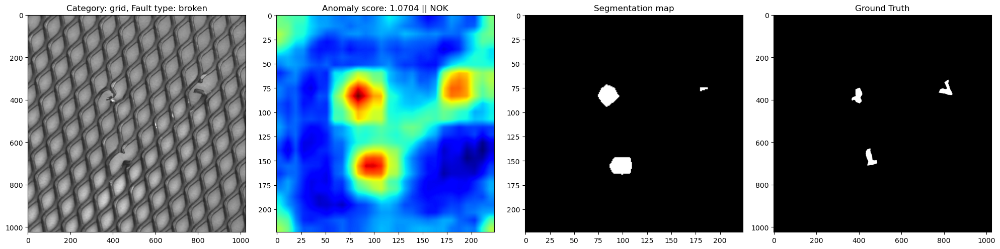

...

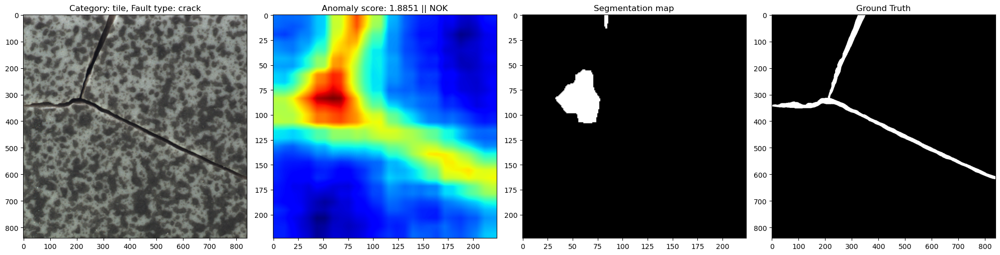

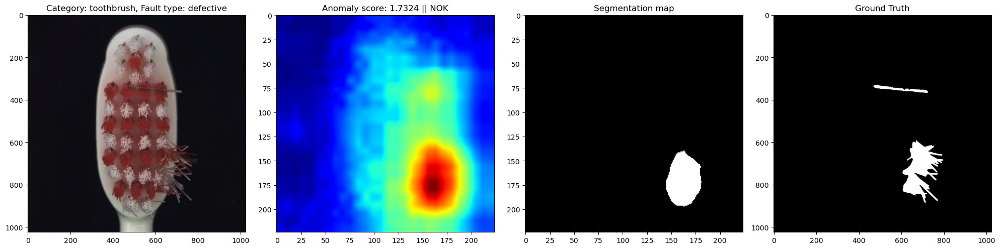

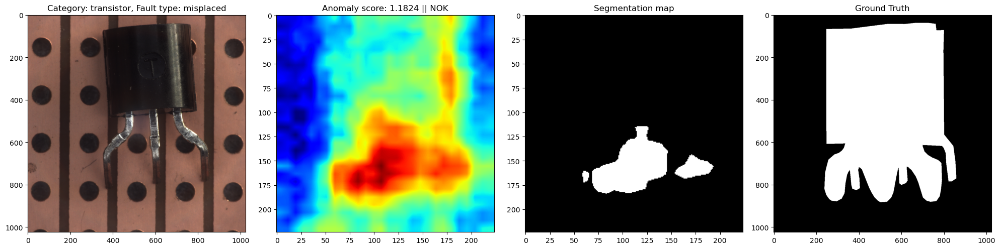

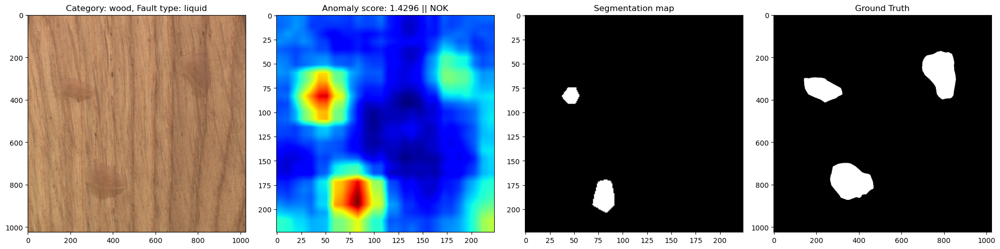

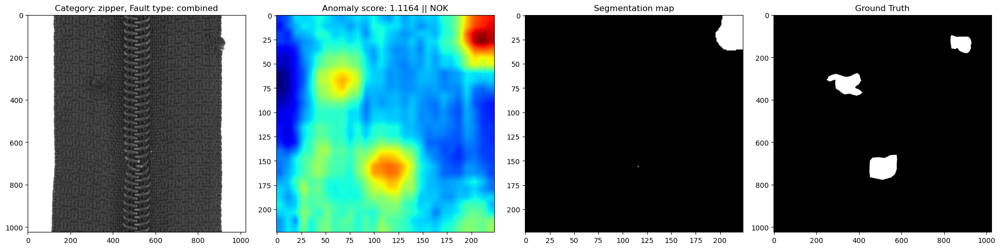

In [79]:
import random
import matplotlib.pyplot as plt
import torch
import numpy as np
from PIL import Image
import cv2
from pathlib import Path

# Define the number of categories to plot
n_categories = len(categories[min_categories:max_categories])
n_cols = 3
n_rows = n_categories // n_cols + int(n_categories % n_cols > 0)

fig = plt.figure(figsize=(15, 5 * n_rows))

for category in categories[min_categories:max_categories]:
    # Get a random anomalous image for the current category
    test_path = random.choice([path for path in test_image_paths_dict[category] if 'good' not in path])
    nok_image = Image.open(test_path).convert('RGB')
    fault_type = Path(test_path).parts[-2]
    
    # Get the corresponding ground truth path
    gt_path = test_path.replace('test', 'ground_truth').replace('.png', '_mask.png')
    gt_image = Image.open(gt_path).convert('L')  # Load as grayscale
    
    # Apply the transformation and add a batch dimension
    transformed_image = transform(nok_image).unsqueeze(0).cuda()
    
    # Extract features using the backbone
    with torch.no_grad():
        features = backbone(transformed_image)
    
    # Calculate distances and segmentation map
    memory_bank = memory_bank_dict[category].cuda()
    distances = torch.cdist(features, memory_bank, p=2.0)
    dist_score, dist_score_idxs = torch.min(distances, dim=1)
    anomaly_score = torch.max(dist_score).item()
    
    segm_map = dist_score.view(1, 1, 28, 28).cpu()
    segm_map = torch.nn.functional.interpolate(     # Upscale by bi-linear interpolation to match the original input resolution
                    segm_map,
                    size=(224, 224),
                    mode='bilinear'
                ).cpu().squeeze().numpy()
    
    # Plot the images
    plt.figure(figsize=(20, 5))
    
    plt.subplot(1, 4, 1)
    plt.imshow(nok_image)
    plt.title(f'Category: {category}, Fault type: {fault_type}')
    
    
    
    plt.subplot(1, 4, 2)
    heat_map = segm_map
    heat_map = cv2.resize(heat_map, (224, 224))
    plt.imshow(heat_map, cmap='jet', vmin=heat_map.min(), vmax=heat_map.max())
    class_label = "NOK" if anomaly_score / best_thresholds[category] > 1 else "OK"
    plt.title(f'Anomaly score: {anomaly_score / best_thresholds[category]:0.4f} || {class_label}')
    
    # Highlight only red/orange/yellow (top range) in the segmentation
    plt.subplot(1, 4, 3)
    norm_heat_map = (heat_map - heat_map.min()) / (heat_map.max() - heat_map.min())
    highlight_mask = norm_heat_map >= 0.8
    plt.imshow(highlight_mask, cmap='gray')
    plt.title('Segmentation map')

    plt.subplot(1, 4, 4)
    plt.imshow(gt_image, cmap='gray')
    plt.title('Ground Truth')
    
    plt.tight_layout()
    plt.show()
